In [2]:

# from __future__ import print_function, division
import os
import sys
import torch
import torch.nn as nn
# import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import cv2

# from __future__ import print_function, division

import pandas as pd
# import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import glob
from skimage import io

from torch.utils.data import Dataset

from torch.autograd import Function
from torch.nn.modules.distance import PairwiseDistance
from tqdm import tqdm
from PIL import Image

import torch.nn.functional as F
# import torch.optim as optim
# import torchvision
# from torchvision import datasets, transforms
from torch. utils.data import DataLoader


In [3]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/home/hafeez/Desktop/face_mask/face_mask_dataset'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=32,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

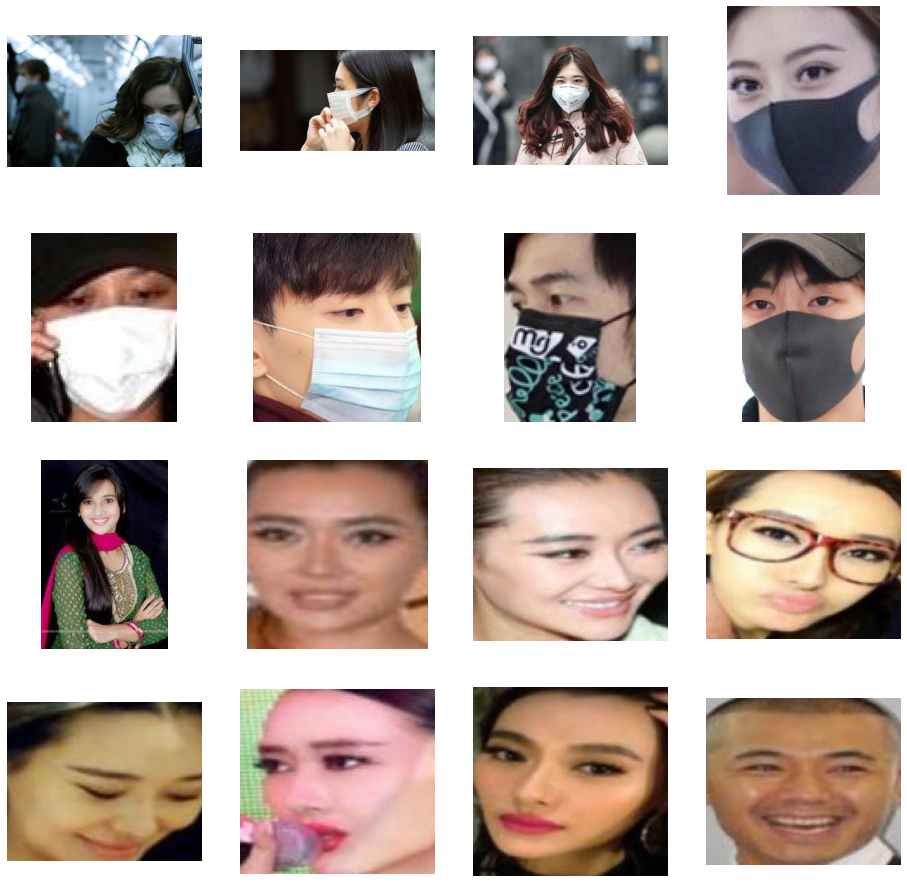

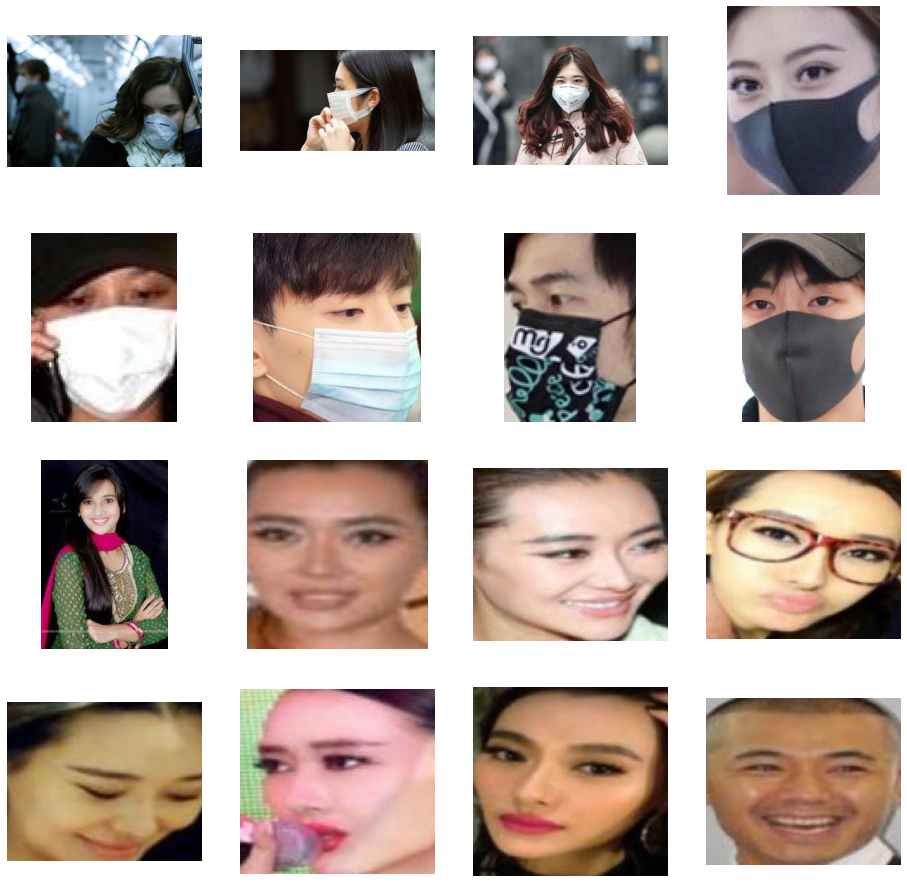

In [4]:
base_dir =  '/home/hafeez/Desktop/face_mask/face_mask_dataset'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'test')

# Directory with our training cat pictures
train_mask_dir = os.path.join(train_dir, 'with_mask')

# Directory with our training dog pictures
train_nomask_dir = os.path.join(train_dir, 'without_mask')

# Directory with our validation cat pictures
validation_mask_dir = os.path.join(validation_dir, 'with_mask')

# Directory with our validation dog pictures
validation_nomask_dir = os.path.join(validation_dir, 'without_mask')
train_mask_fnames = os.listdir(train_mask_dir)

# print(train_mask_fnames[:10])

train_nomask_fnames = os.listdir(train_nomask_dir)
train_nomask_fnames.sort()
# print(train_nomask_fnames[:10])
# Set up matplotlib fig, and size it to fit 4x4 pics
%matplotlib inline


# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4
# train_mask_dir="/content/face_mask_dataset/train"

# Index for iterating over images
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_mask_pix = [os.path.join(train_mask_dir, fname) 
                for fname in train_mask_fnames[pic_index-8:pic_index]]
next_nomask_pix = [os.path.join(train_nomask_dir, fname) 
                for fname in train_nomask_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_mask_pix+next_nomask_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'test')

# Directory with our training cat pictures
train_mask_dir = os.path.join(train_dir, 'with_mask')

# Directory with our training dog pictures
train_nomask_dir = os.path.join(train_dir, 'without_mask')

# Directory with our validation cat pictures
validation_mask_dir = os.path.join(validation_dir, 'with_mask')

# Directory with our validation dog pictures
validation_nomask_dir = os.path.join(validation_dir, 'without_mask')
train_mask_fnames = os.listdir(train_mask_dir)

# print(train_mask_fnames[:10])

train_nomask_fnames = os.listdir(train_nomask_dir)
train_nomask_fnames.sort()
# print(train_nomask_fnames[:10])
# Set up matplotlib fig, and size it to fit 4x4 pics
%matplotlib inline


# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4
# train_mask_dir="/content/face_mask_dataset/train"

# Index for iterating over images
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_mask_pix = [os.path.join(train_mask_dir, fname) 
                for fname in train_mask_fnames[pic_index-8:pic_index]]
next_nomask_pix = [os.path.join(train_nomask_dir, fname) 
                for fname in train_nomask_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_mask_pix+next_nomask_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()


In [5]:
model_ft = torch.load("/home/hafeez/Desktop/face_mask/mask_classifier.pth",map_location=torch.device('cpu'))

In [6]:
from IPython.display import clear_output

# !wget https://github.com/RufinaMay/CV2019Fall_Pictures/raw/master/deploy.prototxt.txt
# !wget https://github.com/RufinaMay/CV2019Fall_Pictures/raw/master/res10_300x300_ssd_iter_140000.caffemodel
# clear_output()

In [7]:
dir="/home/hafeez/Desktop/face_mask/face_mask_dataset/"
image = cv2.imread(dir+"passport_hafeez.jpg",cv2.IMREAD_COLOR)


In [8]:

def read_and_resize_image(filename, grayscale = False, fx= 1, fy=1):
  if grayscale:
    img_result = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
  else:
    imgbgr = cv2.imread(filename, cv2.IMREAD_COLOR)
    img_result = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
  img_result = cv2.resize(img_result, None, fx=fx, fy=fy, interpolation = cv2.INTER_CUBIC)
  return img_result
  
def showInRow(list_of_images, titles = None, disable_ticks = False):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])
      
    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
    if disable_ticks:
      plt.xticks([]), plt.yticks([])
  plt.show()

In [9]:
dir="/home/hafeez/Desktop/face_mask/"

prototxtPath = os.path.sep.join([dir, "deploy.prototxt.txt"])
weightsPath = os.path.sep.join([dir, "res10_300x300_ssd_iter_140000.caffemodel"])
net = cv2.dnn.readNet(prototxtPath, weightsPath)


In [10]:
model_ft = torch.load("/home/hafeez/Desktop/face_mask/mask_classifier.pth",map_location=torch.device('cpu'))
class_names = ['with_mask',
 'without_mask'
]
def process_image(image):
    ''' Scales, crops, and normalizes a PIL image for a PyTorch model,
        returns an Numpy array
    '''
    
    # TODO: Process a PIL image for use in a PyTorch model
    # pil_image = Image.open(image)
    #pil_image = image
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    im_pil = Image.fromarray(img)

    image_transforms = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    img = image_transforms(im_pil)
    return img
def classify_face(image_path):

    device = torch.device("cpu")
    img = process_image(image_path)
    print('image_processed')
    img = img.unsqueeze_(0)
    img = img.float()

    model_ft.eval()
    # model_ft
    output = model_ft(img)
    print(output,'##############output###########')
    _, predicted = torch.max(output, 1)
    print(predicted.data[0],"predicted")


    classification1 = predicted.data[0]
    index = int(classification1)
    print(class_names[index])
    return class_names[index]

(1, 1, 200, 7)


In [11]:
model_ft = models.mobilenet_v2(pretrained=True)
for param in model_ft.parameters():
    param.requires_grad = False
num_ftrs = model_ft.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.classifier = nn.Sequential(
                      nn.Linear(num_ftrs, 2),
                      nn.Sigmoid())
                      # nn.Sigmoid(), 
                      # nn.Dropout(0.4),
                      # nn.Linear(256, 64),
                      # nn.Sigmoid(),
                      # nn.Linear(64,2),
                      # nn.Softmax())
# print(model_ft)
# models.mobmodel_ft.eval()
model_dict= torch.load("/home/hafeez/Desktop/face_mask/mask_classifier.pth",map_location=torch.device('cpu'))

model_ft.load_state_dict(model_dict)
clear_output()

<All keys matched successfully>

(1, 1, 200, 7)
image_processed
tensor([[0.2351, 0.7765]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask
image_processed
tensor([[0.9259, 0.0567]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


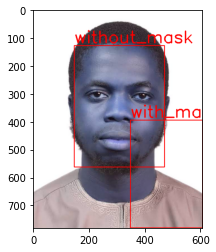

In [13]:


# img_pulp = read_and_resize_image("passport_hafeez.jpg", grayscale = False, fx= 1, fy=1)
# img_pulp_copy= img_pulp.copy()
dir="/home/hafeez/Desktop/face_mask/face_mask_dataset/"
file = "/home/hafeez/Desktop/face_mask/face_mask_dataset/test_img/passport_hafeez.jpg"
image = cv2.imread(file,cv2.IMREAD_COLOR)

dir="/home/hafeez/Desktop/face_mask/"

prototxtPath = os.path.sep.join([dir, "deploy.prototxt.txt"])
weightsPath = os.path.sep.join([dir, "res10_300x300_ssd_iter_140000.caffemodel"])
net = cv2.dnn.readNet(prototxtPath, weightsPath)

# net = cv2.dnn.readNetFromCaffe('deploy.prototxt.txt', 'res10_300x300_ssd_iter_140000.caffemodel')
confidence = 0.5
#  class_names = ['with_mask',
#  'without_mask'
# ]
# image = cv2.imread("rufai.jpg")
img_pulp = image.copy()

(h, w) = img_pulp.shape[:2]
blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0), swapRB = False)
 
net.setInput(blob)
detections = net.forward()
faces=[]
  # filter out weak detections
print(detections.shape)


for i in range(0,detections.shape[2]):
  confidence = detections[0, 0, i, 2]
 
  if confidence > 0.50:
    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
    (startX, startY, endX, endY) = box.astype("int")
    (startX, startY) = (max(0, startX), max(0, startY))
    (endX, endY) = (min(w - 1, endX), min(h - 1, endY))

    face = (startX, startY, endX-startX, endY-startY)
    face = image[startY:endY, startX:endX]
    # showInRow([])
    label =classify_face(face)
    # print(label)
    color = (0, 255, 0) if label == "with mask" else (255, 0, 0)
    # if label =="with mask":
    cv2.rectangle(img_pulp, (startX, startY), (endX, endY), color, 2)
    cv2.putText(img_pulp, label, (startX, startY - 10),cv2.FONT_HERSHEY_SIMPLEX, 2, color, 4)
    # else:
      # cv2.putText(img_pulp, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)
      # cv2.rectangle(img_pulp, (startX, startY), (endX, endY), color, 2)    
showInRow([img_pulp])

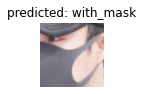

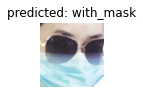

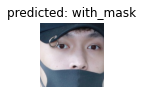

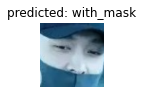

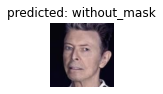

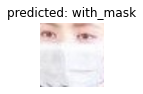

In [12]:
def visualize_model(model, num_images=6):
    # was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            # inputs = inputs.to(device)
            # labels = labels.to(device)

            outputs = model(inputs)
            # print(outputs)
            _, preds = torch.max(outputs, 1)
            # print(preds)
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    # model.train(mode=was_training)
                    return
        # model.train(mode=was_training)
# torch.save(model_ft.state_dict(), "mask_classifier.pth")
# model_ft = model_ft.to(device)
    
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

visualize_model(model_ft)

plt.ioff()
plt.show()

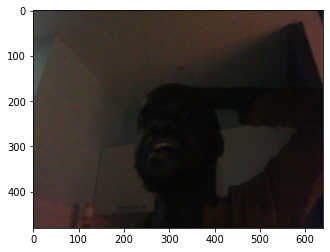

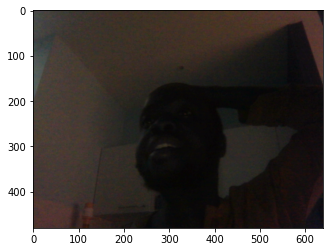

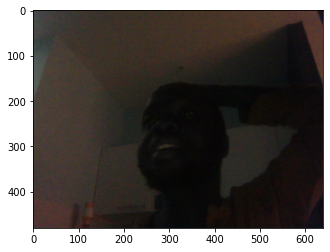

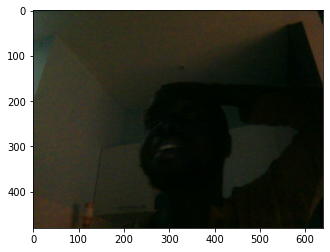

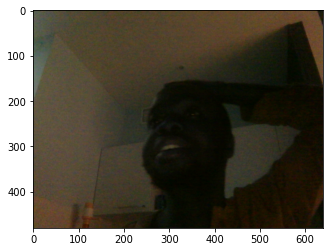

image_processed
tensor([[0.3575, 0.5965]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


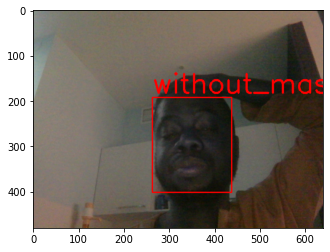

image_processed
tensor([[0.2755, 0.6935]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


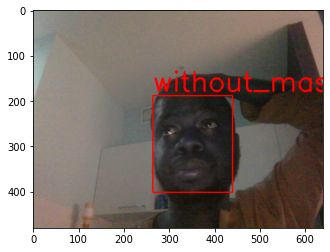

image_processed
tensor([[0.2001, 0.7736]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


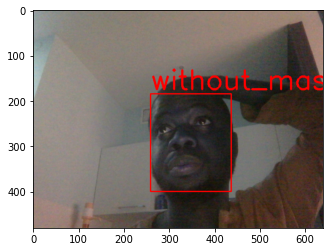

image_processed
tensor([[0.2391, 0.7194]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


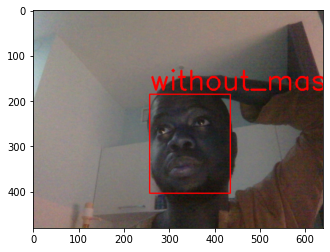

image_processed
tensor([[0.3147, 0.6732]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


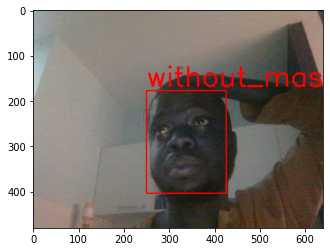

image_processed
tensor([[0.2798, 0.7153]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


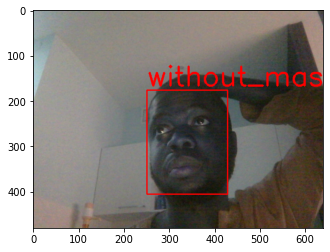

image_processed
tensor([[0.3600, 0.6115]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


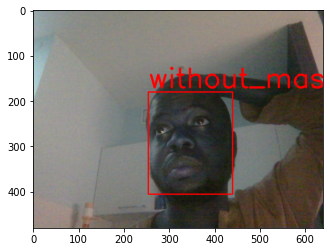

image_processed
tensor([[0.2127, 0.7470]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


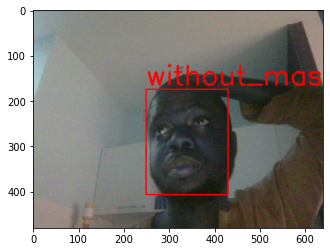

image_processed
tensor([[0.1409, 0.8212]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


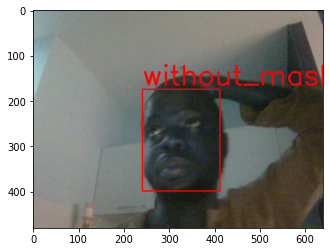

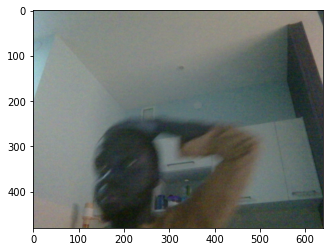

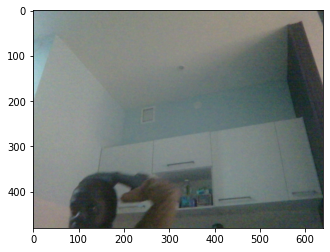

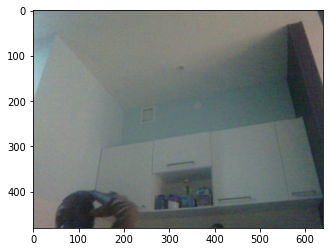

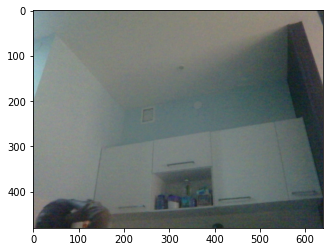

...

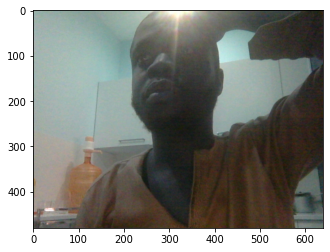

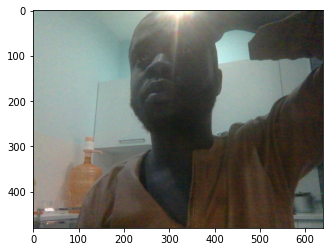

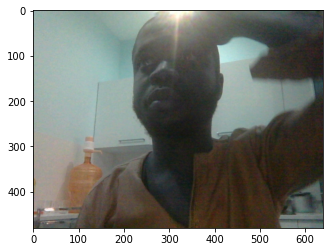

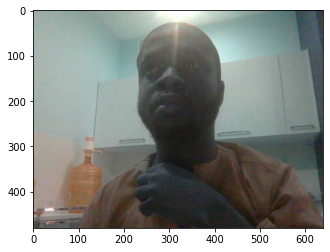

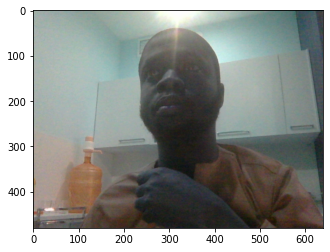

image_processed
tensor([[0.5141, 0.5763]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


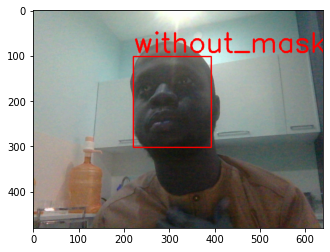

image_processed
tensor([[0.4635, 0.6411]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


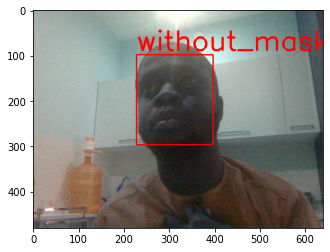

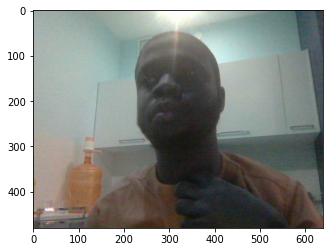

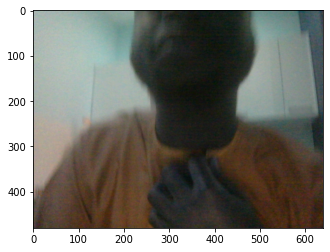

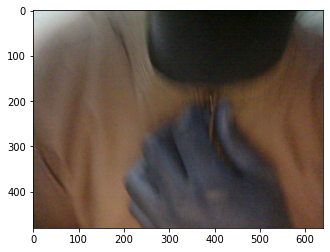

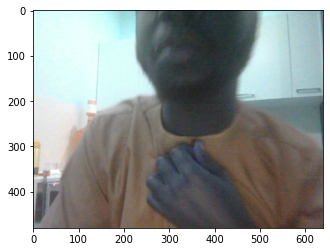

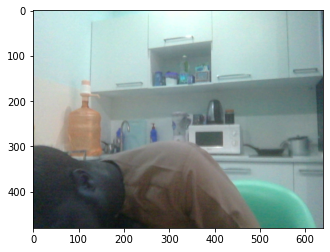

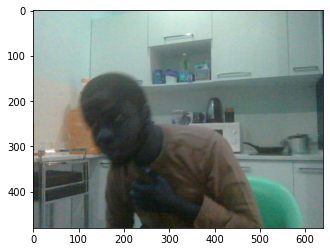

image_processed
tensor([[0.7472, 0.3071]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


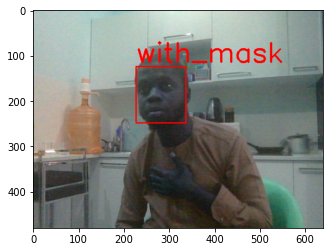

image_processed
tensor([[0.7122, 0.4153]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


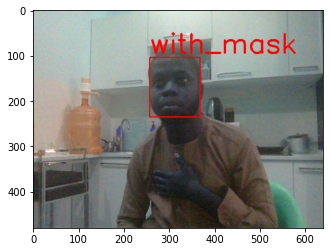

image_processed
tensor([[0.8029, 0.3236]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


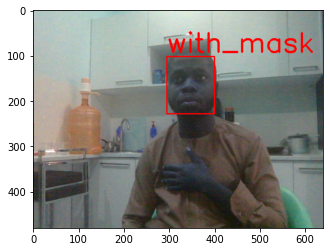

image_processed
tensor([[0.8616, 0.1469]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


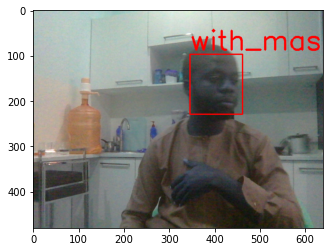

image_processed
tensor([[0.6843, 0.2474]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


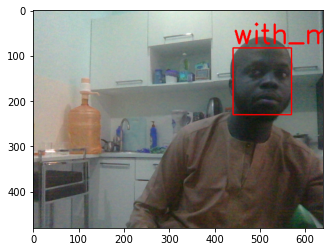

image_processed
tensor([[0.7610, 0.2459]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


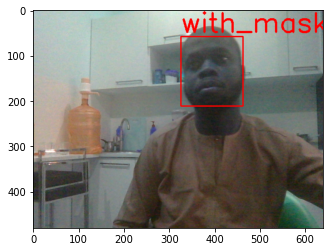

image_processed
tensor([[0.6742, 0.4319]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


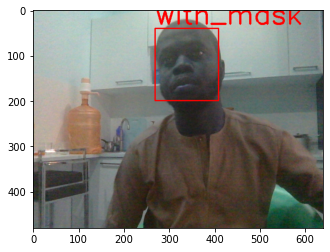

image_processed
tensor([[0.6509, 0.3661]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


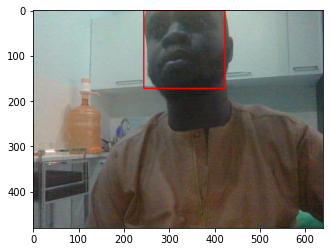

image_processed
tensor([[0.4879, 0.5397]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


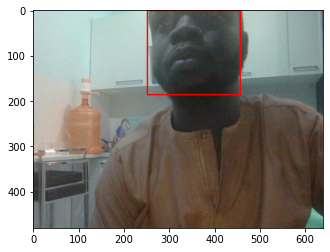

image_processed
tensor([[0.5983, 0.4238]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


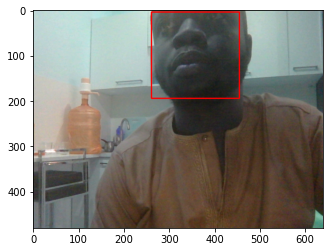

image_processed
tensor([[0.5467, 0.4519]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


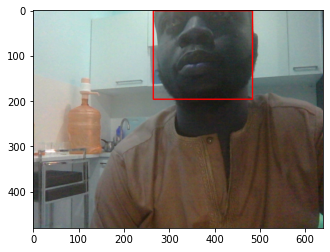

image_processed
tensor([[0.5260, 0.4702]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


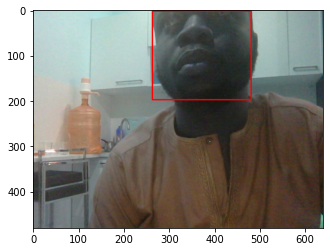

image_processed
tensor([[0.4592, 0.5634]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


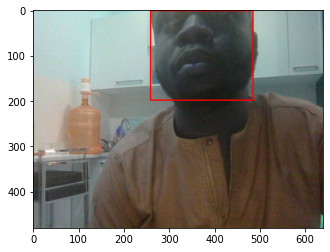

image_processed
tensor([[0.4890, 0.5595]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


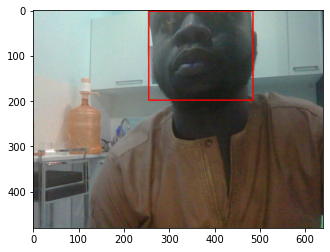

image_processed
tensor([[0.5561, 0.4656]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


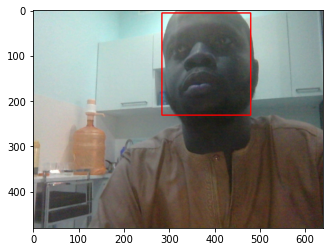

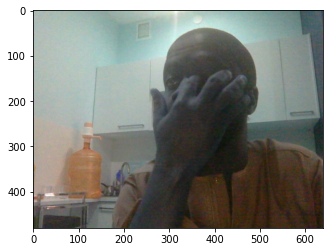

image_processed
tensor([[0.4893, 0.6147]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


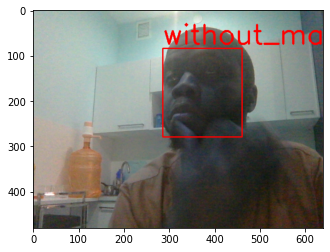

image_processed
tensor([[0.5164, 0.5002]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


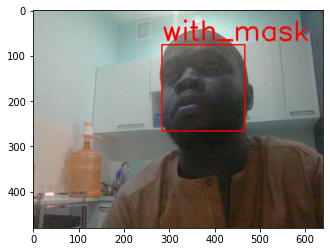

image_processed
tensor([[0.5709, 0.4317]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


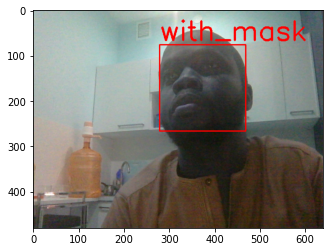

image_processed
tensor([[0.5257, 0.4998]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


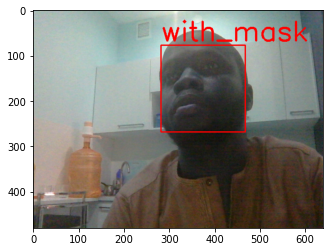

image_processed
tensor([[0.5538, 0.4742]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


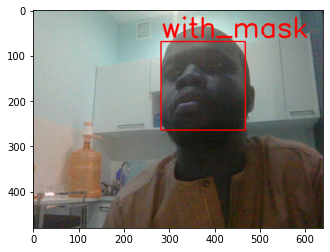

image_processed
tensor([[0.6038, 0.4023]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


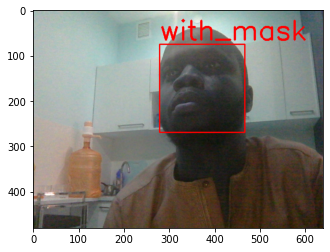

image_processed
tensor([[0.5789, 0.4698]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


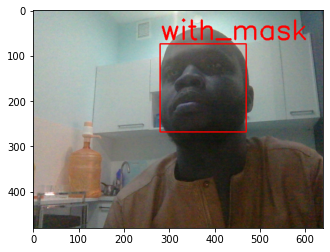

image_processed
tensor([[0.5286, 0.5293]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


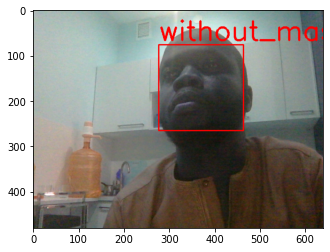

image_processed
tensor([[0.5624, 0.4616]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


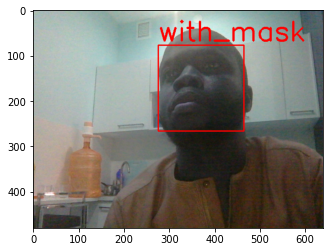

image_processed
tensor([[0.4186, 0.6390]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


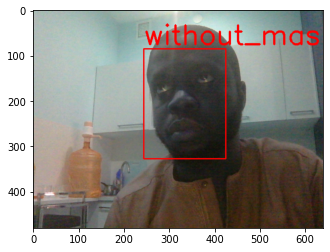

image_processed
tensor([[0.4739, 0.5710]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


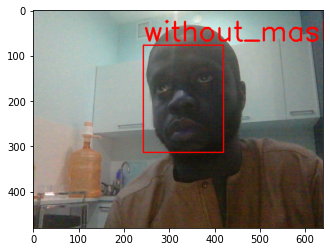

image_processed
tensor([[0.4584, 0.5981]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


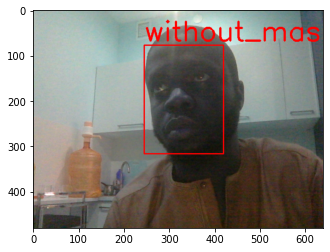

image_processed
tensor([[0.3569, 0.6707]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


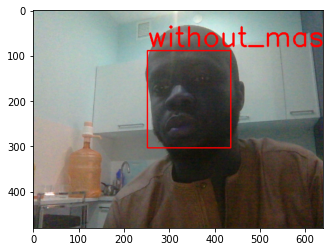

image_processed
tensor([[0.3817, 0.6854]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


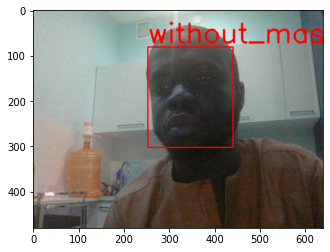

image_processed
tensor([[0.6491, 0.4579]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


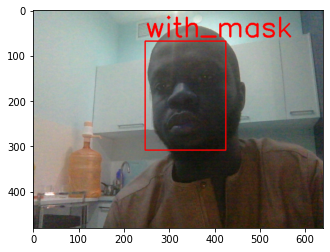

image_processed
tensor([[0.3820, 0.6593]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


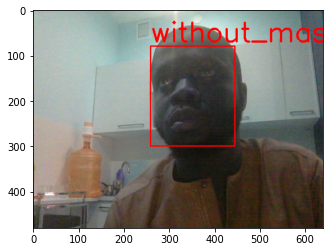

image_processed
tensor([[0.4909, 0.5473]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


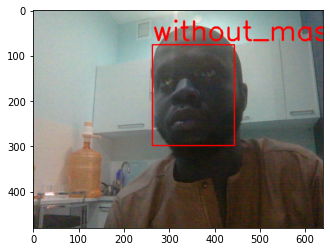

image_processed
tensor([[0.3458, 0.7058]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


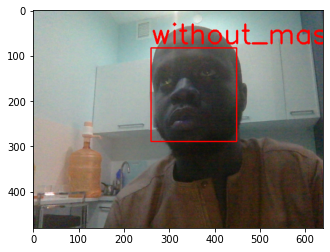

image_processed
tensor([[0.3950, 0.6665]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


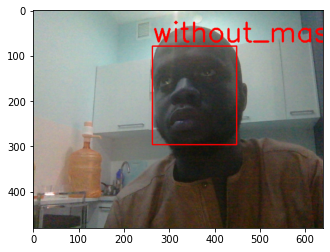

image_processed
tensor([[0.3248, 0.7308]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


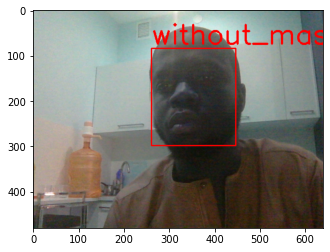

image_processed
tensor([[0.3977, 0.6176]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


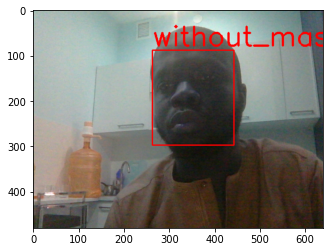

image_processed
tensor([[0.5437, 0.5190]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


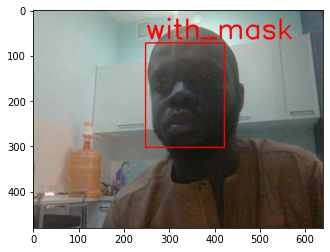

image_processed
tensor([[0.6771, 0.3721]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


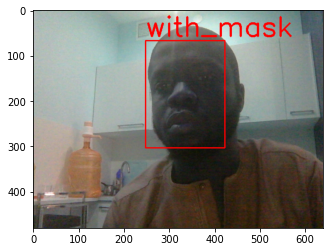

image_processed
tensor([[0.3198, 0.7392]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


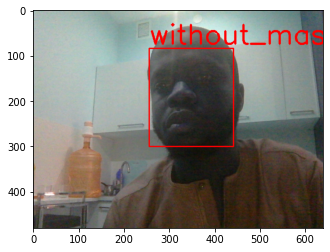

image_processed
tensor([[0.4960, 0.6374]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


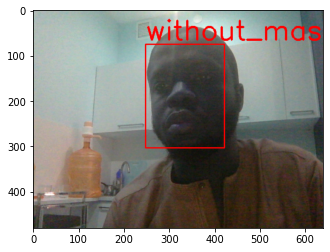

image_processed
tensor([[0.3918, 0.6575]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


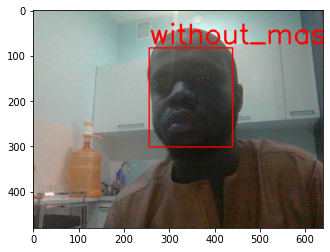

image_processed
tensor([[0.2365, 0.7784]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


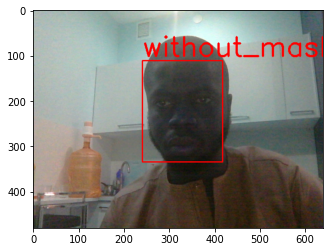

image_processed
tensor([[0.2661, 0.7927]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


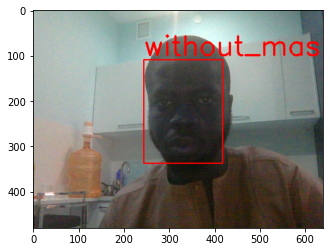

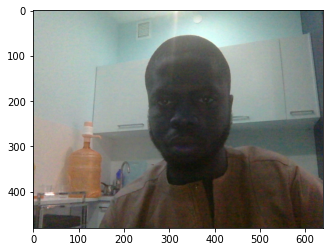

image_processed
tensor([[0.2521, 0.7562]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


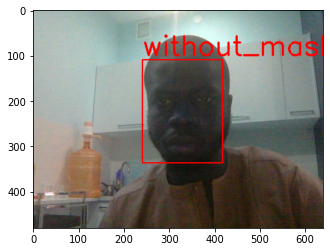

image_processed
tensor([[0.3282, 0.6806]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


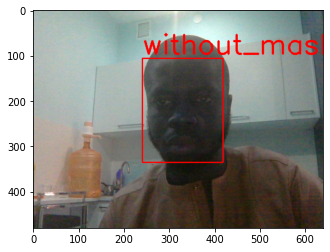

image_processed
tensor([[0.3170, 0.7295]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


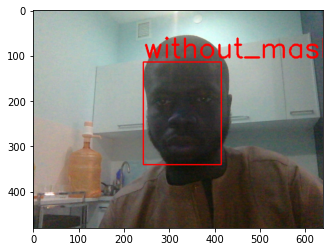

image_processed
tensor([[0.2799, 0.7422]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


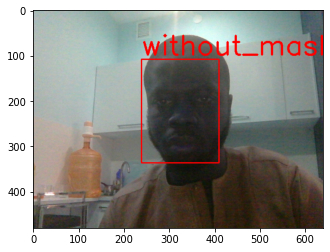

image_processed
tensor([[0.2636, 0.7722]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


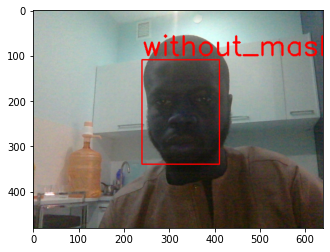

image_processed
tensor([[0.2648, 0.7951]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


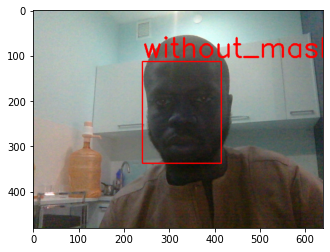

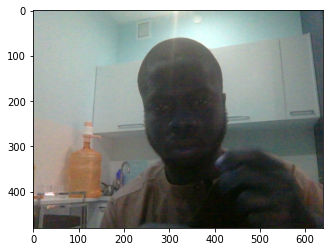

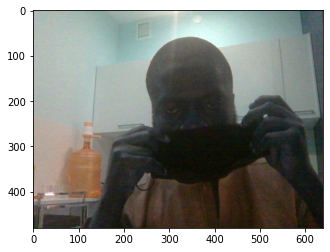

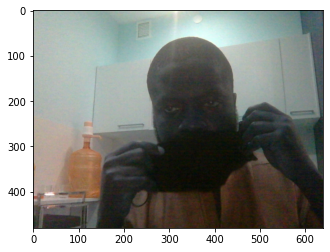

image_processed
tensor([[0.4468, 0.6154]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


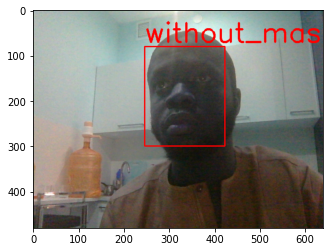

image_processed
tensor([[0.4592, 0.6295]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


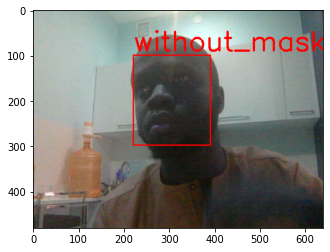

image_processed
tensor([[0.4233, 0.6574]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


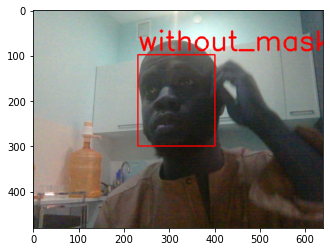

image_processed
tensor([[0.4234, 0.6037]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


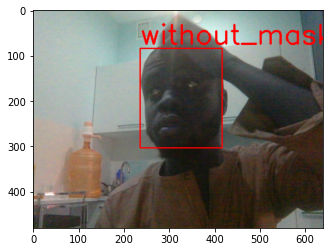

image_processed
tensor([[0.6846, 0.2940]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(0) predicted
with_mask


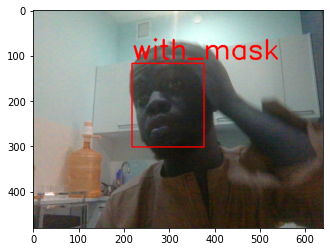

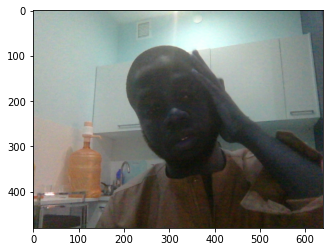

image_processed
tensor([[0.2606, 0.7352]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


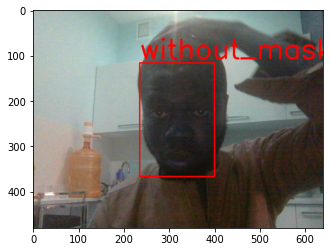

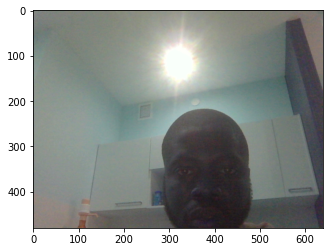

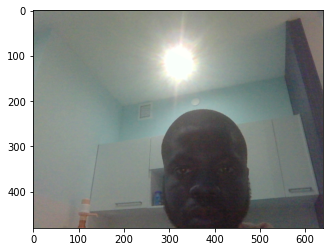

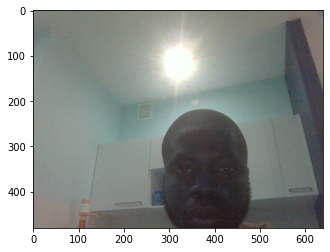

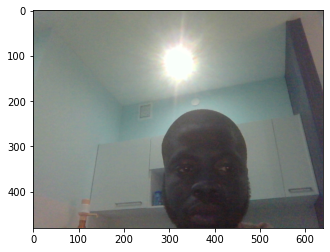

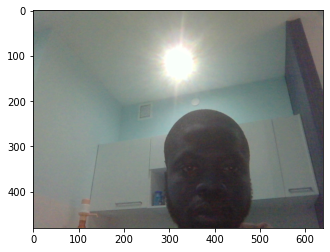

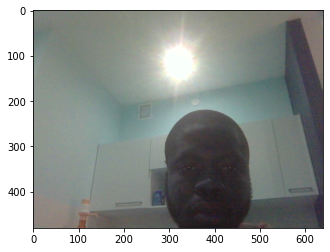

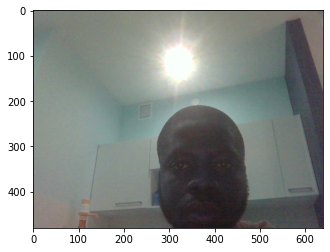

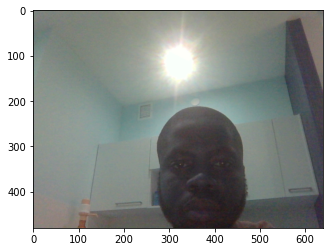

image_processed
tensor([[0.3810, 0.5005]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


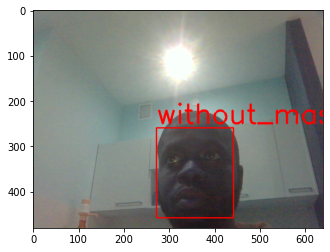

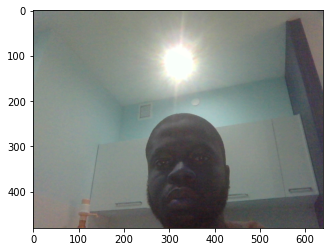

image_processed
tensor([[0.3783, 0.5356]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


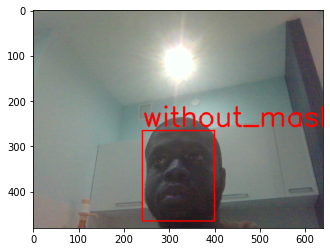

image_processed
tensor([[0.3587, 0.5116]], grad_fn=<SigmoidBackward>) ##############output###########
tensor(1) predicted
without_mask


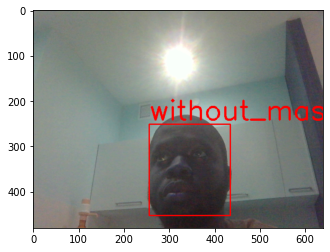

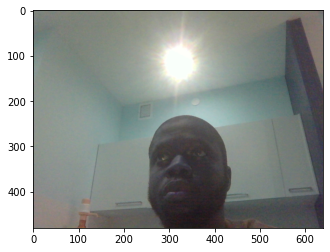

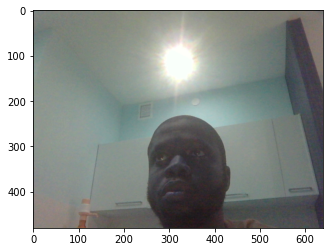

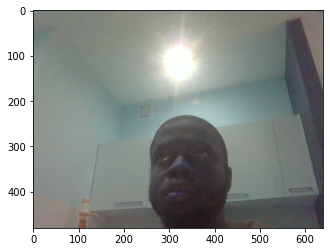

KeyboardInterrupt: 

In [14]:
import cv2
cap = cv2.VideoCapture(0)
while True:
    ret,img = cap.read()

    blob = cv2.dnn.blobFromImage(img, 1.0, (300, 300), (104.0, 177.0, 123.0), swapRB = False)
    (h, w) = img.shape[:2]

    net.setInput(blob)
    detections = net.forward()

    for i in range(0,detections.shape[2]):
        confidence = detections[0, 0, i, 2]
    
        if confidence > 0.30:
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")
            (startX, startY) = (max(0, startX), max(0, startY))
            (endX, endY) = (min(w - 1, endX), min(h - 1, endY))

            face = (startX, startY, endX-startX, endY-startY)
            face = image[startY:endY, startX:endX]
            # showInRow([])
            label =classify_face(face)
            # print(label)
            color = (0, 255, 0) if label == "with mask" else (255, 0, 0)
            # if label =="with mask":
            cv2.rectangle(img, (startX, startY), (endX, endY), color, 2)
            cv2.putText(img, label, (startX, startY - 10),cv2.FONT_HERSHEY_SIMPLEX, 2, color, 4)
        
            output_writer.write(cv2.cvtColor(img, cv2.COLOR_RGB2BGR)) # Converting back to BGR, to write correct colors

    cv2.imshow('FaceMask Detection',img)
    # output_writer.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
    if cv2.waitKey(1) & 0xff == ord('q'):
        break
    out = cv2.VideoWriter('output_multiple.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 25, (640, 360))
    out.release()
    cap.release()
cv2.destroyAllWindows()